In [4]:
import pandas as pd
import glob
import numpy as np
import re
import matplotlib.pyplot as plt

In [5]:
data_dir = 'shots/'

In [7]:
sig_all_names = glob.glob(data_dir + 'TCV_DATA*clean.parquet')
# sig_all = {int(x.split("DATAno")[1].split("clean.parquet")[0]): x for x in sig_all_names} # get sample number
# use regex to get sample number:
sig_all = {int(re.findall(r'\d+', x)[0]): x for x in sig_all_names}
shot_no_list = list(sig_all.keys())


label_all = glob.glob(data_dir + 'TCV_*_apau_labeled.csv')
label_all = {int(x.split("TCV_")[1].split("_apau_labeled.csv")[0]): x for x in label_all}

In [9]:
print(f"All shots: {shot_no_list}")
print("Amount of shots: ", len(shot_no_list))

All shots: [30262, 64686, 65280, 61277, 74916, 68268, 34309, 64678, 57010, 65557, 73367, 48580, 57081, 61055, 65320, 59073, 32716, 33567, 61631, 57095, 64820, 32911, 61716, 63229, 45105, 64923, 61703, 64369, 26386, 61043, 65253, 77604, 63888, 31839, 61057, 66494, 63246, 61274, 64370, 57000, 75263, 75264, 77426, 77092, 64658, 65285, 61260, 64336, 77193, 61275]
Amount of shots:  50


In [11]:
# example
shotno = shot_no_list[0]

sig = pd.read_parquet(sig_all[shotno])
label = pd.read_csv(label_all[shotno])
sig.columns[0:40]


Index(['ShotNum', 'time', 'IP', 'PD', 'FIR', 'WP', 'DML', 'IPref', 'gas_ref',
       'gas_fringes', 'gas_actual_ampl', 'POHM', 'powers_calc', 'NBI', 'ECRH',
       'PradTot_RT', 'PradBulk', 'R_axis', 'Z_axis', 'LI', 'Q95', 'BZERO',
       'VOL', 'AREA', 'SURF', 'BETAN', 'a_minor', 'KAPPA', 'DELTA', 'GAP_in',
       'GAP_out', 'H98y2calc', 'P_LH_RT', 'TS_Te_85_95', 'TS_Ne_85_95',
       'Te_rho_z1', 'Te_rho_z2', 'Te_rho_z3', 'Te_rho_z4', 'Te_rho_z5'],
      dtype='object')

```
cols_control = ["IP", Current (niet reference lijn voor controller, maar de ware input. Dan laat je control bij control)
 "gas_fringes", # Ingepompte gas
 "NBI", # manieren om te verhitten: colliding Neutral beam injection
 "ECRH", # magnetron.
 "a_minor", # reel gemeten plasma shape a k d (horizontale radius
 "KAPPA",
 "DELTA" inkerbovenhoek nar links vanuit hetmidden
]
cols_data = ["FIR", density lijn Interferometer
 "PD", photodiode lijn op de divertor
"DML", Magnetische respons  correleert met de energie in het plasma
"POHM", Gemeten power waarde meet de power die uit wrijving komt
 "Z_axis" center Plasma positie in de verticale lijn. deviation van reference is betekenis. 
]
cols_label = ["LHD_label"]

For the labels, 0 = no label, 1 = low confinement mode, 2 = dithering ('inbetween'), 3 = high confinement mode

This is data for full shots (shot = pulse = experiment). We do not want to model the full shot, but rather an area just around a transition in the LHD_label, so zooming in on say ~100ms before/after a transition in the LHD_label
```

In [12]:
sig

,ShotNum,time,IP,PD,FIR,WP,DML,IPref,gas_ref,gas_fringes,...,SXR_z42,SXR_z43,SXR_z44,SXR_z45,SXR_z46,SXR_z47,SXR_z48,SXR_z49,SXR_z50,SXR_z51
0,30262.0,0.0226,30280.800781,1.860351,3.854967e+18,266.028503,-0.000067,36370.0,NaN,0.392903,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,30262.0,0.0227,30280.800781,1.791991,3.775597e+18,266.028503,-0.000053,36370.0,NaN,0.386981,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,30262.0,0.0228,30280.800781,1.748046,3.870517e+18,266.028503,-0.000037,36370.0,NaN,0.393257,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,30262.0,0.0229,31228.250000,1.743163,3.882429e+18,266.028503,-0.000037,36370.0,NaN,0.392771,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,30262.0,0.0230,31228.250000,1.713866,3.962964e+18,266.028503,-0.000037,36370.0,NaN,0.402935,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18606,30262.0,1.8832,31689.765625,2.734374,1.096547e+19,819.501831,0.000049,36370.0,3.7,1.172460,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18607,30262.0,1.8833,31165.244141,2.841795,1.082919e+19,819.501831,0.000060,36370.0,3.7,1.160637,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18608,30262.0,1.8834,31165.244141,2.866210,1.085068e+19,819.501831,0.000060,36370.0,3.7,1.158343,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18609,30262.0,1.8835,30761.992188,2.788085,1.075751e+19,819.501831,0.000028,36370.0,3.7,1.153764,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Text(0, 0.5, 'confinement label')

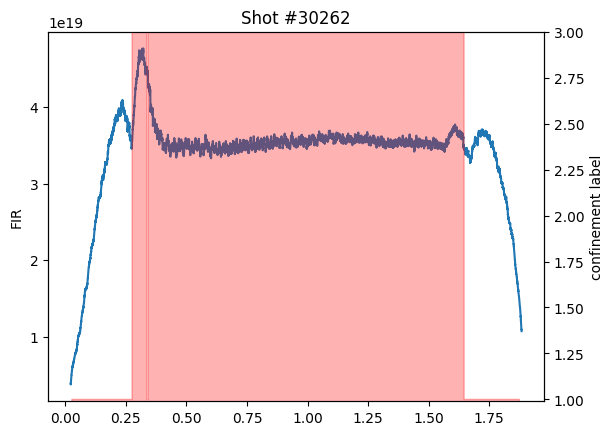

In [14]:
fig, ax = plt.subplots()
plt.title(f"Shot #{shotno}")

ax.plot(sig["time"], sig["FIR"])
ax.set_ylabel("FIR")

ax2 = ax.twinx()

# interpolate missing labels (label==0) to previous
labelvals = np.array(label["LHD_label"])
mask = labelvals == 0
labelvals[mask] = np.interp(np.flatnonzero(mask), np.flatnonzero(~mask), labelvals[~mask])
# plot filled area:
ax2.fill_between(label["time"], labelvals, color='red', alpha=.3, )
# ax2.plot(label["time"], labelvals, color='red', alpha=.3, )
# set axis limits:
ax2.set_ylim([0.99, 3])
ax2.set_ylabel("confinement label")

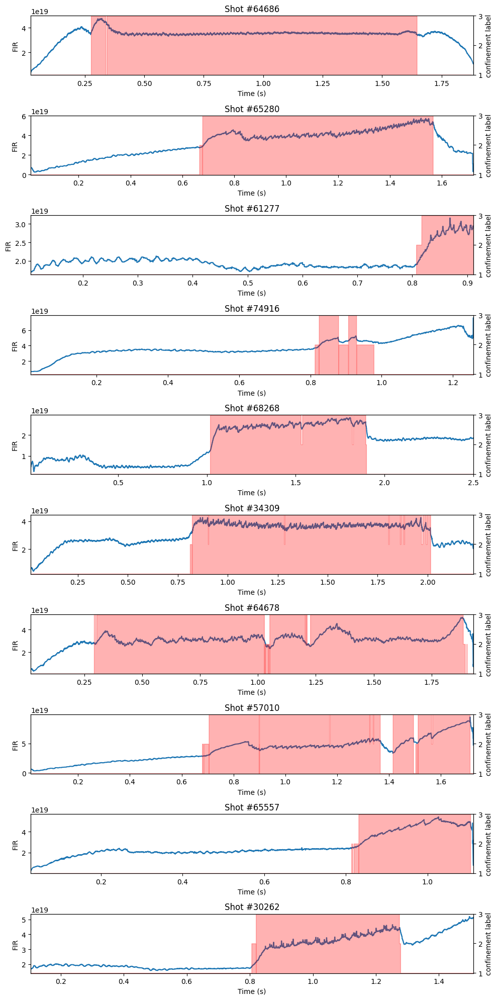

In [35]:
fig, axs = plt.subplots(10, 1, figsize=(10, 20))

shot_keys = list(sig_all.keys())
# plt.suptitle("FIR response with red-marked H-mode for 10 shots")

for i, shotno in enumerate(shot_keys[0:10]):
    sig = pd.read_parquet(sig_all[shotno])
    label = pd.read_csv(label_all[shotno])
    is_dithering = label["LHD_label"] == 2
    plt.title(f"Shot #{shotno}")
    
    axs2 = axs[i].twinx()
    axs2.fill_between(label["time"], label["LHD_label"], color='red', alpha=.3)
    ax2.plot(label.loc[is_dithering,"time"], label.loc[is_dithering,"LHD_label"], color='purple', alpha=.3, )
    axs[i].plot(sig["time"], sig["FIR"])
    axs[i].set_ylabel("FIR")
    
    
    axs2.set_ylim([0.99, 3])
    axs2.set_ylabel("confinement label")
    
    # Set x-axis limits
    axs[i].set_xlim([sig["time"].min(), sig["time"].max()])
    
    # Add time label to x-axis
    axs[i].set_xlabel("Time (s)")

    
plt.tight_layout()
plt.savefig('10shots.pdf')  

plt.show()
